# <center><font color='MediumSeaGreen'> _Módulo Machine Learning G45_</font>
# <center><font color='MediumSeaGreen'> Desafío guiado - Regularización </font>
## <center> _Método de regularización lineal y expansiones basales_ 
    
### <center><b> Bárbara Pérez </b><center>
    
    

___

## <font color='MediumSeaGreen'>Requerimientos</font>

- Nuestro propósito será tratar de predecir su calidad a partir de su composición química.

- Comience su estudio realizando un breve análisis exploratorio y descriptivo:

    - Identifique el tipo de datos de cada columna.
    - Identifique outliers univariados y multivariados. Los primeros los puede encontrar realizando boxplots de cada atributo, los segundos estudiando los scatterplot entre pares de atributos.
    - Encuentre la cantidad de valores faltantes en cada columna.
    - Grafique la distribución empírica de cada atributo.

_______

## <font color='MediumSeaGreen'>Ejercicio 1: Preparación del Ambiente de Trabajo</font>

- Importe las librerías básicas.
- Importe los métodos asociados a regularización.
- Importe la base de datos.

In [1]:
#Importar librerias basicas
import matplotlib.pyplot as plt #version 3.5.2
import pandas as pd  #version 1.4.3
import seaborn as sns  #version 0.11.2
import numpy as np  #version 1.23.0


import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importar librerias asociadas a regularización

#librería para análisis exploratorio
import pandas_profiling

#librería para pre procesamiento
from sklearn.preprocessing import StandardScaler

#librerias para modelamiento

from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import train_test_split

#librerías para las métricas
from sklearn.metrics import mean_squared_error, median_absolute_error

In [3]:
#seteamos elementos cosméticos para los gráficos
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (10, 6)

In [4]:
#Importar base de datos
df = pd.read_csv('winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


___

## <font color='MediumSeaGreen'>Ejercicio 2: Análisis exploratorio</font>

- Identifique el tipo de datos de cada columna.
- Identifique outliers univariados y multivariados. 
   - Los primeros los puede encontrar realizando boxplots de cada atributo, 
   - los segundos estudiando los scatterplot entre pares de atributos.

In [5]:
#inspeccionamos las variables identificando los tipos de datos de cada columna
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [6]:
#ispeccionamos visualmente la data
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
#revisamos el contenido del vector objetivo
df['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

Se aprecia que el vector objetivo 'quality' tiene datos numericos

In [8]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- Identifique outliers univariados y multivariados. 
   - Los primeros los puede encontrar realizando boxplots de cada atributo

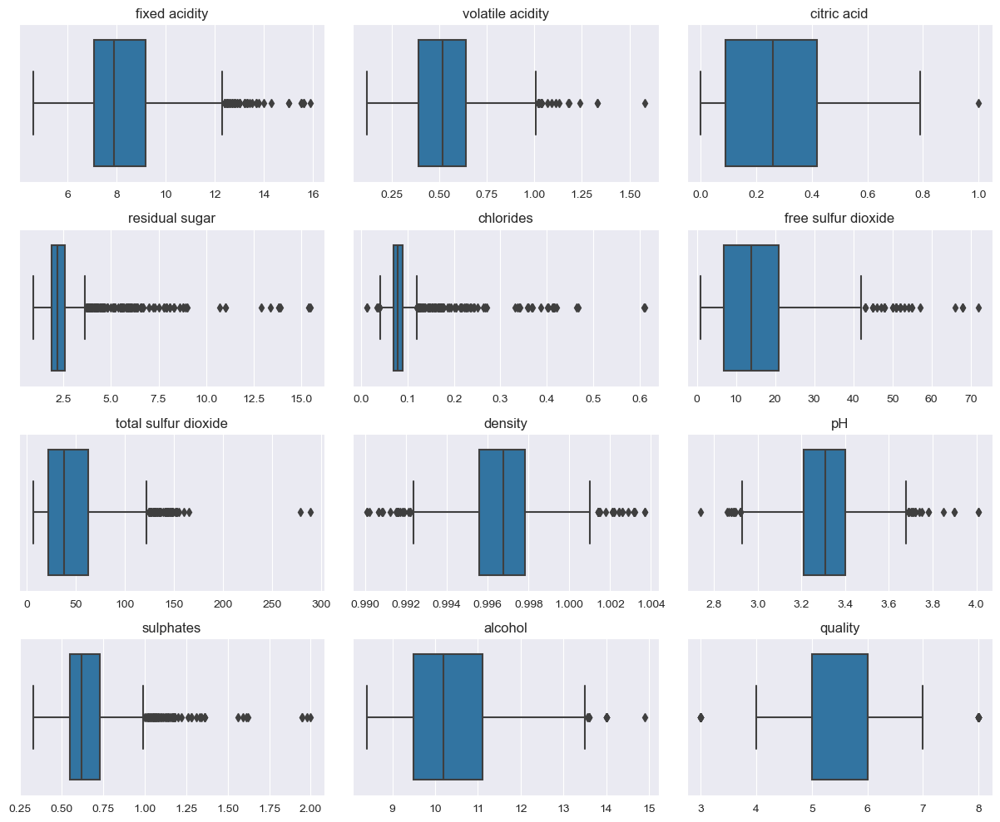

In [9]:
cols = 3
rows = int(df.shape[1] / cols)

plt.figure(figsize=(12,10))
for i, col in enumerate(df.columns):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(df[col])
    plt.title(col)
    plt.xlabel('')

plt.tight_layout()
plt.show()

Se observan la mayoria de los graficos con gran dispersión de datos, lo que sugiere la necesidad de aplicar una función logarítmica

In [10]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns = df.columns)



X_train, X_test, y_train, y_test = train_test_split(df_scaled.iloc[:, :-1], df_scaled.iloc[:,-1],
                                                    test_size = 0.25, shuffle=True, random_state = 42)

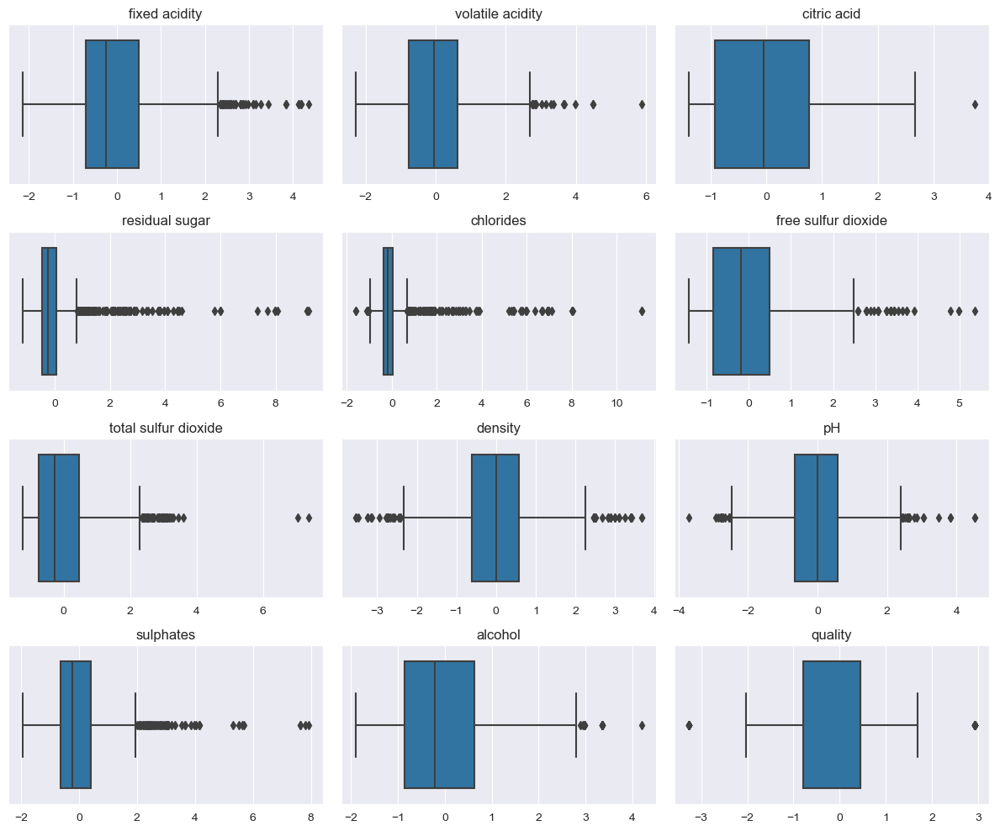

In [11]:
plt.figure(figsize=(12,10))
for i, col in enumerate(df.columns):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(df_scaled[col])
    plt.title(col)
    plt.xlabel('')

plt.tight_layout()
plt.show()

## <font color='MediumSeaGreen'>Ejercicio 3: Regularización de modelos</font>

- Genere tres modelos, correspondientes a <span style='background:gainsboro'><font color='dimgray'>RidgeCV</font></span> , <span style='background:gainsboro'><font color='dimgray'>LassoCV</font></span> y <span style='background:gainsboro'><font color='dimgray'>ElasticNetCV</font></span>. Para cada uno de ellos implemente los siguientes pasos:
    E -ntrene los modelos con 10 validaciones cruzadas.
    - Extraiga los coeficientes estimados, el mejor valor alpha, MAE (<span style='background:gainsboro'><font color='dimgray'>median_absolute_error</font></span>) y RMSE (raiz cuadrada de <span style='background:gainsboro'><font color='dimgray'>mean_squared_error</font></span>) asociado a cada modelo.
    - En base a la información solicitada, responda lo siguiente:
    - ¿Qué modelo presenta un mejor desempeño en base a las métricas?
    - ¿Qué atributos mantienen un comportamiento similar a lo largo de cada modelo?


### <font color='MediumSeaGreen'>Sobre los métodos RidgeCV , LassoCV y ElasticNetCV</font>

- Para implementar la búsqueda de hiper parámetros con validación cruzada, utilizaremos la clase <span style='background:gainsboro'><font color='dimgray'>sklearn.linear_model.{RidgeCV, LassoCV, ElasticNetCV}</font></span>.

- Por defecto, la clase necesita de una lista de valores <span style='background:gainsboro'><font color='dimgray'>alphas</font></span> que representa el hiper parámetros de validación. Si no se define la lista, el método incorporará un array con valores por defecto.

- Por defecto la clase tendrá una opción scoring que permitirá definir la métrica con la cual se evaluará el mejor hiper parámetro. Para el caso de un problema de regresión, si no se define, la métrica será el error cuadrático promedio negativo (más alto es mejor).

- Una vez entrenado el modelo, se puede reportar el mejor alpha con <span style='background:gainsboro'><font color='dimgray'>modelo_entrenado.alpha_</font></span>, 
    el valor de los coeficientes con <span style='background:gainsboro'><font color='dimgray'>modelo_entrenado.coef_</font></span> y 
   los valores de la métrica de desempeño con <span style='background:gainsboro'><font color='dimgray'>modelo_entrenado.cv_values_</font></span>

In [12]:
#Ridge
alphas=[0.1, 1.0, 10.0]
ridge_cv = RidgeCV(cv=10, alphas=alphas)
model_ridge = ridge_cv.fit(X_train, y_train)
y_hat_ridge = model_ridge.predict(X_test)

#Metricas
ridge_mae = median_absolute_error(y_hat_ridge, y_test)
ridge_rmse = np.sqrt(mean_squared_error(y_hat_ridge,y_test))

print('Valor del parámetro de regularización:{0}'.format(model_ridge.alpha_))
print('Coeficientes finales: \n{0}'.format(model_ridge.coef_))
print('RMSE de pruebas: {0}'.format(ridge_rmse))
print('MAE de pruebas: {0}'.format(ridge_mae))

Valor del parámetro de regularización:10.0
Coeficientes finales: 
[ 0.05171984 -0.22122281 -0.02862004  0.01735463 -0.10189407  0.06280238
 -0.14710856 -0.04461045 -0.06103819  0.17180412  0.37102758]
RMSE de pruebas: 0.7719574117959532
MAE de pruebas: 0.5049691736036985


In [13]:
# Lasso

lasso_cv = LassoCV(cv=10)
model_lasso = lasso_cv.fit(X_train, y_train)
lasso_mae = median_absolute_error(model_lasso.predict(X_test), y_test)
lasso_rmse = np.sqrt(mean_squared_error(model_lasso.predict(X_test), y_test))

print('Valor del parámetro de regularización:{0}'.format(model_lasso.alpha_))
print('Coeficientes finales: \n{0}'.format(model_lasso.coef_))
print('RMSE de pruebas: {0}'.format(lasso_rmse))
print('MAE de pruebas: {0}'.format(lasso_mae))

Valor del parámetro de regularización:0.011266843992228987
Coeficientes finales: 
[ 0.         -0.21485994 -0.          0.         -0.09162251  0.03463127
 -0.12215256 -0.         -0.05820333  0.15389476  0.38731718]
RMSE de pruebas: 0.7751017515608977
MAE de pruebas: 0.5189379130363738


In [14]:
# Elastic Net
enet_cv = ElasticNetCV(cv=10)
model_enet = enet_cv.fit(X_train, y_train)
enet_mae = median_absolute_error(model_enet.predict(X_test), y_test)
enet_rmse = np.sqrt(mean_squared_error(model_enet.predict(X_test), y_test))

print('Valor del parámetro de regularización: {0}'.format(model_enet.alpha_))
print('Coeficientes finales: \n{0}'.format(model_enet.coef_))
print('RMSE de pruebas: {0}'.format(enet_rmse))
print('MAE de pruebas: {0}'.format(enet_mae))

Valor del parámetro de regularización: 0.019598652649782625
Coeficientes finales: 
[ 0.         -0.21395852 -0.          0.         -0.09322958  0.03754834
 -0.12505964 -0.         -0.05942415  0.15469553  0.38456393]
RMSE de pruebas: 0.7749040231817501
MAE de pruebas: 0.5182080941600191


Se observa que el moldelo **RidgeCV** presenta un mejor desempeño.

__________

 - En base a la información solicitada, responda lo siguiente:
    - ¿Qué modelo presenta un mejor desempeño en base a las métricas?
    - ¿Qué atributos mantienen un comportamiento similar a lo largo de cada modelo?

### Obtenemos los coeficientes estimados

In [15]:
plt.subplot(1, 2, 1)
plt.plot(['ridge', 'lasso', 'enet'], [ridge_mae, lasso_mae, enet_mae], 'o')
plt.axhline(np.mean([ridge_mae, lasso_mae, enet_mae]), color='tomato')
plt.ylim(.5, .6)
plt.title('Median Absolute Error')
plt.subplot(1, 2, 2)
plt.plot(['ridge', 'lasso', 'enet'],[ridge_rmse, lasso_rmse, enet_rmse], 'o')
plt.axhline(np.mean([ridge_rmse, lasso_rmse, enet_rmse]), color='tomato')
plt.ylim(.7, .8)
plt.title('Root Mean Squared Error');

In [16]:
comparecoefs = pd.DataFrame({'ridge':model_ridge.coef_,
                             'lasso':model_lasso.coef_,
                             'enet':model_enet.coef_})

comparecoefs['coefs'] = df.columns.drop('quality')

plt.plot(comparecoefs['ridge'],comparecoefs['coefs'], 'o', label='Ridge', markersize=10)
plt.plot(comparecoefs['lasso'],comparecoefs['coefs'], '^', alpha=.5, label='Lasso', markersize=12)
plt.plot(comparecoefs['enet'],comparecoefs['coefs'], 's', alpha=.5, label='Elastic Net', markersize=13)
plt.xlabel(r'Model coefs given optimized $\lambda$')
plt.legend()
plt.title(r'$\beta$ en cada modelo' )

print()

Los siguientes atributos mantienen un comportamiento similar a lo largo de cada modelo:

- Volatile acidity
- Chlorides
- Total sulfur dioxide
- pH
- Alcohol